### 📑 Dicionário de Dados - Visão Geral

A base utilizada neste projeto contém informações financeiras, comportamentais e históricas de crédito dos clientes. Abaixo, um resumo das principais colunas:

| Coluna                     | Descrição                                                        |
|---------------------------|-------------------------------------------------------------------|
| ID                        | Identificador único do registro                                   |
| Customer_ID               | Identificador do cliente                                          |
| Month                     | Mês de referência da transação                                    |
| Name                      | Nome do cliente                                                   |
| Age                       | Idade do cliente                                                  |
| SSN                       | Número de segurança social (formato com caracteres especiais)     |
| Occupation                | Profissão do cliente                                              |
| Annual_Income             | Renda anual                                                       |
| Monthly_Inhand_Salary     | Salário mensal disponível                                         |
| Num_Bank_Accounts         | Número de contas bancárias                                        |
| Num_Credit_Card           | Número de cartões de crédito                                      |
| Interest_Rate             | Taxa de juros                                                     |
| Num_of_Loan               | Quantidade de empréstimos ativos                                  |
| Type_of_Loan              | Tipos de empréstimos (texto com múltiplos valores)                |
| Delay_from_due_date       | Dias de atraso no pagamento                                       |
| Num_of_Delayed_Payment    | Número de pagamentos atrasados                                    |
| Changed_Credit_Limit      | Alteração no limite de crédito                                    |
| Num_Credit_Inquiries      | Número de consultas de crédito                                    |
| Credit_Mix                | Tipo de crédito utilizado (ruim, padrão, bom)                     |
| Outstanding_Debt          | Dívida pendente                                                   |
| Credit_Utilization_Ratio  | Percentual de utilização do limite de crédito                     |
| Credit_History_Age        | Tempo de histórico de crédito                                     |
| Payment_of_Min_Amount     | Se o pagamento mínimo foi realizado                               |
| Payment_Behaviour         | Comportamento de pagamento                                        |
| Monthly_Balance           | Saldo médio mensal                                                |
| Amount_invested_monthly   | Valor investido mensalmente                                       |
| Credit_Score              | Classificação do crédito (ruim, padrão, bom)                      |
 
Estas colunas passarão por etapas de limpeza, transformação e modelagem para alimentar o pipeline de classificação de clientes.


In [0]:
#Importações
from pyspark.sql.functions import col, sum, when, trim, regexp_replace, mean, min, max, count, when, percentile_approx, lit, expr, regexp_extract
from pyspark.sql.functions import sum as spark_sum
from pyspark.sql.types import DoubleType, IntegerType, StringType
from functools import reduce
from pyspark.sql import DataFrame
from functools import reduce
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [0]:
#carregar base e visualizar dados
df_total = spark.read.csv("/FileStore/tables/client_credit_train.csv", header=True, inferSchema=True)
display(df_total)

ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.8433333333328,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,4.0,_,809.98,26.822619623699016,22 Years and 1 Months,No,49.57494921489417,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,null,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",-1,null,11.27,4.0,Good,809.98,31.94496005538421,NA,No,49.57494921489417,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,null,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,_,4.0,Good,809.98,28.60935202206993,22 Years and 3 Months,No,49.57494921489417,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,null,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",5,4,6.27,4.0,Good,809.98,31.377861869582354,22 Years and 4 Months,No,49.57494921489417,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.8433333333328,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",6,null,11.27,4.0,Good,809.98,24.797346908844986,22 Years and 5 Months,No,49.57494921489417,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,null,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",8,4,9.27,4.0,Good,809.98,27.26225871052017,22 Years and 6 Months,No,49.57494921489417,62.430172331195294,!@9#%8,340.4792117872438,Good
0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.8433333333328,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8_,11.27,4.0,Good,809.98,22.53759303178384,22 Years and 7 Months,No,49.57494921489417,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good
0x1609,CUS_0xd40,August,null,23,#F%$D@*&8,Scientist,19114.12,1824.8433333333328,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,6,11.27,4.0,Good,809.98,23.93379480196552,NA,No,49.57494921489417,24.785216509052056,High_spent_Medium_value_payments,358.12416760938714,Standard
0x160e,CUS_0x21b1,January,Rick Rothackerj,28_,004-07-5839,_______,34847.84,3037.986666666666,2,4,6,1,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,24.46403063758457,26 Years and 7 Months,No,18.816214573128885,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard
0x160f,CUS_0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986666666666,2,4,6,1,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848433956325,26 Years and 8 Months,No,18.816214573128885,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good


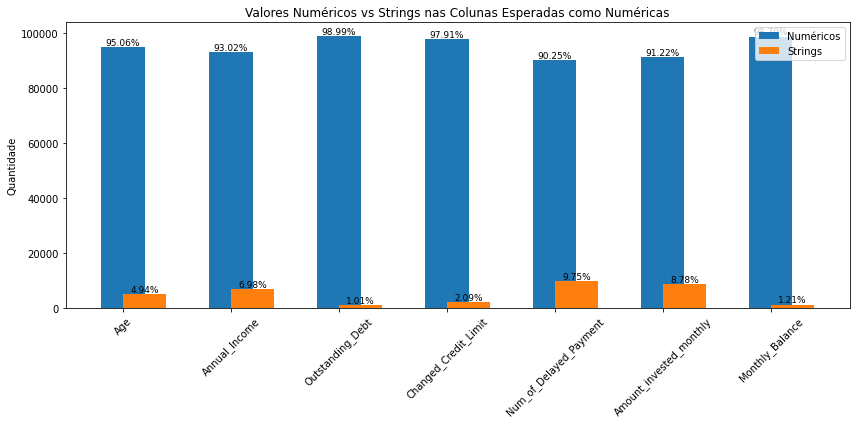

In [0]:
# Lista das colunas que deveriam ser numéricas
numeric_columns = [
    "Age", "Annual_Income", "Outstanding_Debt",
    "Changed_Credit_Limit", "Num_of_Delayed_Payment",
    "Amount_invested_monthly", "Monthly_Balance"
]

# Inicializar listas para contagens e percentuais
string_counts = []
numeric_counts = []
percentages_numeric = []
percentages_string = []

# Verificar coluna por coluna
total_rows = df_total.count()

for column in numeric_columns:
    df_checked = df_total.withColumn(
        "is_numeric", when(col(column).cast("double").isNotNull(), 1).otherwise(0)
    )
    
    num_valid = df_checked.filter(col("is_numeric") == 1).count()
    num_invalid = df_checked.filter(col("is_numeric") == 0).count()
    
    numeric_counts.append(num_valid)
    string_counts.append(num_invalid)
    
    percentages_numeric.append(round((num_valid / total_rows) * 100, 2))
    percentages_string.append(round((num_invalid / total_rows) * 100, 2))

# Plotando o gráfico
labels = numeric_columns
x = range(len(labels))

plt.figure(figsize=(12, 6))
bars1 = plt.bar(x, numeric_counts, width=0.4, label="Numéricos", align='center')
bars2 = plt.bar(x, string_counts, width=0.4, label="Strings", align='edge')

plt.xticks(ticks=x, labels=labels, rotation=45)
plt.ylabel("Quantidade")
plt.title("Valores Numéricos vs Strings nas Colunas Esperadas como Numéricas")
plt.legend()

# Adicionar percentuais no topo das barras
for i, (bar1, bar2) in enumerate(zip(bars1, bars2)):
    plt.text(bar1.get_x() + bar1.get_width() / 2, bar1.get_height() + 10,
             f"{percentages_numeric[i]}%", ha='center', va='bottom', fontsize=9)
    plt.text(bar2.get_x() + bar2.get_width() / 2, bar2.get_height() + 10,
             f"{percentages_string[i]}%", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


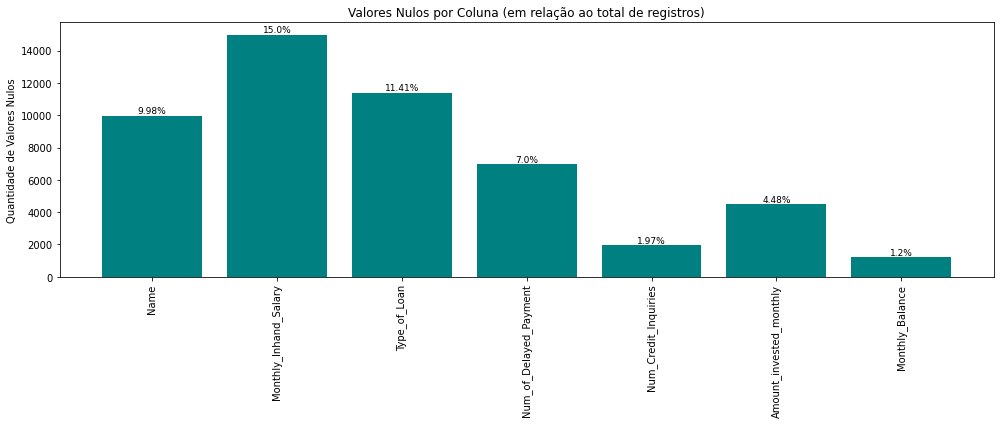

In [0]:
# Total de registros no DataFrame
total_registros = df_total.count()

# Contar valores nulos por coluna
null_counts = df_total.select([
    spark_sum(col(c).isNull().cast("int")).alias(c) for c in df_total.columns
]).collect()[0].asDict()

# Manter apenas colunas com pelo menos um nulo
null_counts = {k: v for k, v in null_counts.items() if v > 0}

# Preparar dados para o gráfico
colunas = list(null_counts.keys())
valores_nulos = list(null_counts.values())
percentuais = [round((n / total_registros) * 100, 2) for n in valores_nulos]

# Gráfico
plt.figure(figsize=(14, 6))
bars = plt.bar(colunas, valores_nulos, color='teal')
plt.xticks(rotation=90)
plt.ylabel("Quantidade de Valores Nulos")
plt.title("Valores Nulos por Coluna (em relação ao total de registros)")

# Adicionar percentual acima das barras
for bar, pct in zip(bars, percentuais):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{pct}%", 
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

In [0]:
#Diagnóstico Inicial do DataFrame

# Ver estrutura e tipos das colunas
print("Estrutura do DataFrame:")
df_total.printSchema()

# Ver número de linhas e colunas
linhas = df_total.count()
colunas = len(df_total.columns)
print(f"\n Dimensões do DataFrame: {linhas} linhas x {colunas} colunas")

# Verificar valores nulos por coluna
print("\n Valores Nulos por Coluna:")
df_total.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df_total.columns
]).show()

# Verificar valores em branco por coluna (strings vazias)
print(" Valores em Branco ('') por Coluna:")
df_total.select([
    sum(when(trim(col(c)) == "", 1).otherwise(0)).alias(c)
    for c in df_total.columns
]).show()

# Verificar registros duplicados
print("\n Total de registros duplicados:")
duplicados = df_total.groupBy(df_total.columns).count().filter("count > 1").count()
print(f"{duplicados} registros duplicados encontrados.")


Estrutura do DataFrame:
root
 |-- ID: string (nullable = true)
 |-- Customer_ID: string (nullable = true)
 |-- Month: string (nullable = true)
 |-- Name: string (nullable = true)
 |-- Age: integer (nullable = true)
 |-- SSN: string (nullable = true)
 |-- Occupation: string (nullable = true)
 |-- Annual_Income: double (nullable = true)
 |-- Monthly_Inhand_Salary: double (nullable = true)
 |-- Num_Bank_Accounts: integer (nullable = true)
 |-- Num_Credit_Card: integer (nullable = true)
 |-- Interest_Rate: integer (nullable = true)
 |-- Num_of_Loan: double (nullable = true)
 |-- Type_of_Loan: string (nullable = true)
 |-- Delay_from_due_date: integer (nullable = true)
 |-- Num_of_Delayed_Payment: integer (nullable = true)
 |-- Changed_Credit_Limit: double (nullable = true)
 |-- Num_Credit_Inquiries: double (nullable = true)
 |-- Credit_Mix: string (nullable = true)
 |-- Outstanding_Debt: double (nullable = true)
 |-- Credit_Utilization_Ratio: double (nullable = true)
 |-- Credit_History_Ag

In [0]:
# Dicionário com o tipo alvo desejado
colunas_para_converter = {
    "Age": IntegerType(),
    "Annual_Income": DoubleType(),
    "Outstanding_Debt": DoubleType(),
    "Changed_Credit_Limit": DoubleType(),
    "Num_of_Delayed_Payment": IntegerType(),
    "Amount_invested_monthly": DoubleType(),
    "Monthly_Balance": DoubleType()
}

# Limpeza de caracteres inválidos e conversão de tipo
for coluna, tipo in colunas_para_converter.items():
    df_total = df_total.withColumn(coluna, regexp_replace(col(coluna), "[^0-9.]", ""))  # Remove tudo que não for número ou ponto
    df_total = df_total.withColumn(coluna, col(coluna).cast(tipo))

# Verificando novamente os tipos após conversão
df_total.printSchema()

# Dados após limpeza
df_total.select(list(colunas_para_converter.keys())).show(5)


In [0]:
# Colunas numéricas com nulos (exceto Credit_History_Age e Age)
colunas_numericas = [
    "Monthly_Inhand_Salary",
    "Num_of_Delayed_Payment",
    "Changed_Credit_Limit",
    "Num_Credit_Inquiries",
    "Amount_invested_monthly",
    "Monthly_Balance"
]

# Lista para armazenar os resultados
resultados = []

# Loop para calcular estatísticas
for coluna in colunas_numericas:
    resumo = df_total.select(
        col(coluna).cast("double").alias(coluna)
    ).agg(
        count(coluna).alias("total_registros"),
        count(when(col(coluna).isNull(), True)).alias("nulos"),
        mean(coluna).alias("media"),
        percentile_approx(coluna, 0.5, 100).alias("mediana"),
        min(coluna).alias("minimo"),
        max(coluna).alias("maximo")
    ).withColumn("coluna", lit(coluna))

    resultados.append(resumo)

# União dos resultados
estatisticas_df = reduce(DataFrame.unionByName, resultados)

# Reordena as colunas para visualização
estatisticas_df = estatisticas_df.select("coluna", "total_registros", "nulos", "media", "mediana", "minimo", "maximo")

# Exibe a tabela de estatísticas
estatisticas_df.orderBy("coluna").show(truncate=False)

# Converte o DataFrame Spark para Pandas
estatisticas_pd = estatisticas_df.select("coluna", "total_registros", "mediana").toPandas()

# Plotando gráfico de barras agrupadas
x = np.arange(len(estatisticas_pd))  # posições das colunas
largura = 0.35  # largura das barras

fig, ax = plt.subplots(figsize=(10, 6))
barras1 = ax.bar(x - largura/2, estatisticas_pd["total_registros"], largura, label="Total de registros")
barras2 = ax.bar(x + largura/2, estatisticas_pd["mediana"], largura, label="Mediana")

ax.set_xlabel("Colunas")
ax.set_ylabel("Valores")
ax.set_title("Comparação entre Total de Registros e Mediana")
ax.set_xticks(x)
ax.set_xticklabels(estatisticas_pd["coluna"], rotation=45, ha="right")
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()



In [0]:
# Calcular a mediana de cada coluna usando percentile_approx (equivalente ao 50º percentil)
medianas = {
    coluna: df_total.select(percentile_approx(coluna, 0.5).alias("mediana")).first()["mediana"]
    for coluna in colunas_numericas
}

# Substituir nulos pela mediana correspondente
for coluna in colunas_numericas:
    mediana = medianas[coluna]
    df_total = df_total.withColumn(
        coluna,
        when(col(coluna).isNull(), mediana).otherwise(col(coluna))
    )

In [0]:
# Identificar colunas do tipo string
colunas_string = [f.name for f in df_total.schema.fields if isinstance(f.dataType, StringType)]

# Substituir valores nulos por "NA" nessas colunas
for coluna in colunas_string:
    df_total = df_total.withColumn(
        coluna,
        when(col(coluna).isNull(), "NA").otherwise(col(coluna))
    )


In [0]:
# Contagem de nulos por coluna
nulos_por_coluna = df_total.select([
    spark_sum(col(c).isNull().cast("int")).alias(c) for c in df_total.columns
])

nulos_por_coluna.show(truncate=False)

In [0]:
# Selecionar registros com Age > 110 ou acima do limite IQR
outliers_age = df_total.filter(col("Age") > 110)

# Calcular a mediana de Age
mediana_age = df_total.select(
    percentile_approx("Age", 0.5, 100).alias("mediana")
).collect()[0]["mediana"]

# Substituir valores maiores que 110 pela mediana
df_total = df_total.withColumn(
    "Age",
    when(col("Age") > 110, lit(mediana_age)).otherwise(col("Age"))
)


In [0]:
# Filtrar registros com valores que não seguem o padrão comum (ex: letras, underscore e sem caracteres especiais)
valores_irregulares = df_total.filter(~col("Payment_Behaviour").rlike("^[A-Za-z_]+$"))

# Mostrar os valores
valores_irregulares.select("Payment_Behaviour").show(truncate=False)
print(f"contagem de valores: {valores_irregulares.count()}")

# Substituir o valor '!@9#%8' por NA na coluna Payment_Behaviour
df_total = df_total.withColumn(
    "Payment_Behaviour",
    when(col("Payment_Behaviour").isNull(), "NA").otherwise(col("Payment_Behaviour"))
)

# Verificação após substituição
df_total.select("Payment_Behaviour").distinct().show(truncate=False)



In [0]:
# Extrair os números de anos e meses
df_total = df_total.withColumn("credit_years", regexp_extract(col("Credit_History_Age"), r"(\d+)\s+Years", 1).cast("int"))
df_total = df_total.withColumn("credit_months", regexp_extract(col("Credit_History_Age"), r"(\d+)\s+Months", 1).cast("int"))

# Calcular o total de meses
df_total = df_total.withColumn("Credit_History_Months", (col("credit_years") * 12 + col("credit_months")))

# Remover as colunas temporárias
df_total = df_total.drop("credit_years", "credit_months")

# Visualizar valores convertidos
df_total.select("Credit_History_Age", "Credit_History_Months").show(10, truncate=False)

In [0]:
df_total = df_total.withColumn(
    "Credit_History_Months",
    when(col("Credit_History_Months").isNull(), "NA").otherwise(col("Payment_Behaviour"))
)

# Verificação após substituição
df_total.select("Credit_History_Months").distinct().show(truncate=False)

In [0]:
display(df_total)

ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Credit_History_Months
0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.8433333333328,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,4.0,NA,809.98,26.822619623699016,22 Years and 1 Months,No,49.57494921489417,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good,High_spent_Small_value_payments
0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,3093.153333333333,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",-1,14,11.27,4.0,Good,809.98,31.94496005538421,NA,No,49.57494921489417,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good,NA
0x1604,CUS_0xd40,March,Aaron Maashoh,33,821-00-0265,Scientist,19114.12,3093.153333333333,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,9.4,4.0,Good,809.98,28.60935202206993,22 Years and 3 Months,No,49.57494921489417,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good,Low_spent_Medium_value_payments
0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,3093.153333333333,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",5,4,6.27,4.0,Good,809.98,31.377861869582354,22 Years and 4 Months,No,49.57494921489417,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good,Low_spent_Small_value_payments
0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.8433333333328,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",6,14,11.27,4.0,Good,809.98,24.797346908844986,22 Years and 5 Months,No,49.57494921489417,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good,High_spent_Medium_value_payments
0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,3093.153333333333,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",8,4,9.27,4.0,Good,809.98,27.26225871052017,22 Years and 6 Months,No,49.57494921489417,62.430172331195294,!@9#%8,340.4792117872438,Good,!@9#%8
0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.8433333333328,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8,11.27,4.0,Good,809.98,22.53759303178384,22 Years and 7 Months,No,49.57494921489417,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good,Low_spent_Small_value_payments
0x1609,CUS_0xd40,August,NA,23,#F%$D@*&8,Scientist,19114.12,1824.8433333333328,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,6,11.27,4.0,Good,809.98,23.93379480196552,NA,No,49.57494921489417,24.785216509052056,High_spent_Medium_value_payments,358.12416760938714,Standard,NA
0x160e,CUS_0x21b1,January,Rick Rothackerj,28,004-07-5839,NA,34847.84,3037.986666666666,2,4,6,1.0,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,24.46403063758457,26 Years and 7 Months,No,18.816214573128885,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard,Low_spent_Small_value_payments
0x160f,CUS_0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986666666666,2,4,6,1.0,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848433956325,26 Years and 8 Months,No,18.816214573128885,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good,High_spent_Large_value_payments


In [0]:
# Contar quantos registros têm na Payment_of_Min_Amount o valor "NM"
display(df_total.filter(df_total["Payment_of_Min_Amount"] == "NM").count())

# Substituindo "NN" por "No"
df_total = df_total.withColumn(
    "Payment_of_Min_Amount",
    when(col("Payment_of_Min_Amount") == "NM", "No").otherwise(col("Payment_of_Min_Amount"))
)

display(df_total.filter(df_total["Payment_of_Min_Amount"] == "NM").count())

In [0]:
# Contar quantos registros têm na Occupation o valor "_______"
display(df_total.filter(df_total["Occupation"]== "_______").count())

# Substituindo "_______" por "NA"
df_total = df_total.withColumn(
    "Occupation",
    when(col("Occupation")== "_______", "NA").otherwise(col("Occupation"))
)
display(df_total.filter(df_total["Occupation"]== "_______").count())

In [0]:

# DataFrame com registros inválidos - negativos ou com caracteres especiais
df_num_of_loan = df_total.filter(
    (col("Num_of_Loan").rlike("[^0-9.-]")) | (col("Num_of_Loan").cast("double") < 0)
)

display(df_num_of_loan)

# Corrigir a coluna Num_of_Loan no DataFrame principal
df_total = df_total.withColumn(
    "Num_of_Loan",
    regexp_replace("Num_of_Loan", "[^0-9.]", "")  # Remove caracteres especiais
).withColumn(
    "Num_of_Loan",
    col("Num_of_Loan").cast(DoubleType())  # Converte para tipo numérico
).withColumn(
    "Num_of_Loan",
    when(col("Num_of_Loan") < 0, 0).otherwise(col("Num_of_Loan"))  # Substitui negativos por 0
)

In [0]:
# Contar quantos registros têm na Credit_Mix o valor "_"
display(df_total.filter(df_total["Credit_Mix        "]== "_").count())

# Substituindo "_" por "NA"
df_total = df_total.withColumn(
    "Credit_Mix",
    when(col("Credit_Mix")== "_", "NA").otherwise(col("Credit_Mix"))
)
display(df_total.filter(df_total["Credit_Mix"]== "_______").count())

In [0]:
# Substituir 'Yes' por 0 e 'No' por 1 na coluna Payment_of_Min_Amount
df_total = df_total.withColumn(
    "Payment_of_Min_Amount",
    when(F.col("Payment_of_Min_Amount") == "Yes", 0)
    .when(F.col("Payment_of_Min_Amount") == "No", 1)
    .otherwise(F.col("Payment_of_Min_Amount"))
)

# Filtrando os dados não numéricos na coluna 'Payment_of_Min_Amount'
df_non_numeric = df_total.filter(~F.col("Payment_of_Min_Amount").rlike("^[0-9]+$"))

# Mostrar os resultados
df_non_numeric.show(5)

+---+-----------+-----+----+---+---+----------+-------------+---------------------+-----------------+---------------+-------------+-----------+------------+-------------------+----------------------+--------------------+--------------------+----------+----------------+------------------------+------------------+---------------------+-------------------+-----------------------+-----------------+---------------+------------+---------------------+
| ID|Customer_ID|Month|Name|Age|SSN|Occupation|Annual_Income|Monthly_Inhand_Salary|Num_Bank_Accounts|Num_Credit_Card|Interest_Rate|Num_of_Loan|Type_of_Loan|Delay_from_due_date|Num_of_Delayed_Payment|Changed_Credit_Limit|Num_Credit_Inquiries|Credit_Mix|Outstanding_Debt|Credit_Utilization_Ratio|Credit_History_Age|Payment_of_Min_Amount|Total_EMI_per_month|Amount_invested_monthly|Payment_Behaviour|Monthly_Balance|Credit_Score|Credit_History_Months|
+---+-----------+-----+----+---+---+----------+-------------+---------------------+-----------------+-